###Alphafold2 Conformation Generation Pipeline
Notebook and code written by Felipe Engelberger, 2024.
Built using ColabDesign by Sergey O.

felipeengelberger@gmail.com

In [ ]:
%%time
#%pip uninstall chex -y
# @title setup {"display-mode":"form"}
%pip -qq install git+https://github.com/sokrypton/ColabDesign.git@gamma
# @title Install
%cd /content
%pip install -q biopython igraph leidenalg
%pip -q install git+https://github.com/engelberger/frustrapy.git@dev
%pip install -q -U kaleido==0.2.1
%cd /workspaces/alphamask/
%pip install -e .

INFO:alphamask.utils.logging:Starting masking experiment with strategy: iterative_single


INFO:alphamask.utils.logging:Starting vanilla AlphaFold2 prediction (Control)


Setup path is present.
HHsuite is present.
mmseqs2 is imported.
jobname I89S_plus_vanilla_897a1_1
length=[94] copies=1
{'sequence': ['GSHMASMEDLQAEARAFLSEEMIAEFKAAFDMFDADGGGDISYKAVGTVFRMLGINPSKEVLDYLKEKIDVDGSGTIDFEEFLVLMVYIMKQDA'], 'copies': 1, 'msa_method': 'mmseqs2', 'pair_mode': 'unpaired_paired', 'do_not_filter': False, 'cov': 75, 'id': 90, 'template_mode': 'none', 'propagate_to_copies': True}
getting unpaired MSA


COMPLETE: 100%|██████████| 150/150 [elapsed: 00:02 remaining: 00:00]


parsing msas
gathering info
filtering sequences
Current PATH: /usr/bin:/root/.local/bin:/vscode/cursor-server/bin/linux-x64/2eaa79a1b14ccff5d1c78a2c358a08be16a8e5a0/bin/remote-cli:/opt/bin:/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/tools/node/bin:/tools/google-cloud-sdk/bin:/vscode/cursor-server/bin/linux-x64/2eaa79a1b14ccff5d1c78a2c358a08be16a8e5a0/bin/remote-cli:/opt/bin:/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/tools/node/bin:/tools/google-cloud-sdk/bin
hhfilter location: None
hhfilter not found in PATH. Adding it now.
Updated PATH: /usr/bin:/root/.local/bin:/vscode/cursor-server/bin/linux-x64/2eaa79a1b14ccff5d1c78a2c358a08be16a8e5a0/bin/remote-cli:/opt/bin:/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/tools/node/bin:/tools/google-cloud-sdk/bin:/vscode/cursor-server/bin/linux-x64/2eaa79a1b14ccff5d1c78a2c3

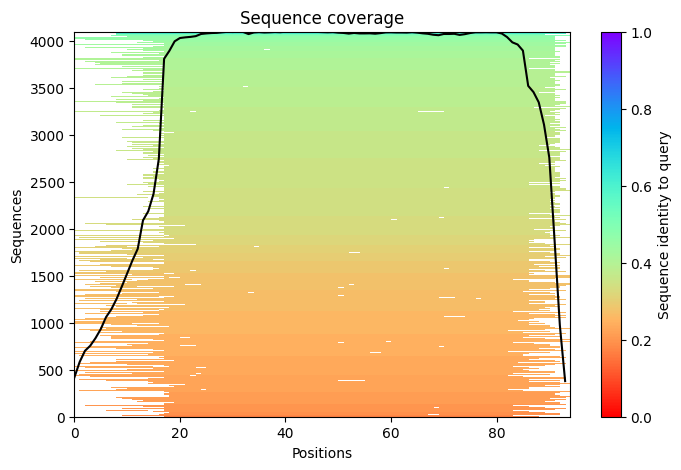

GC 6001
loading alphafold params
running prediction
seed=000 model=model_1_ptm recycle=0
seed=000 model=model_1_ptm recycle=1
seed=000 model=model_1_ptm recycle=2
seed=000 model=model_1_ptm recycle=3
seed=000 model=model_1_ptm recycle=4
seed=000 model=model_2_ptm recycle=0
seed=000 model=model_2_ptm recycle=1
seed=000 model=model_2_ptm recycle=2
seed=000 model=model_2_ptm recycle=3
seed=000 model=model_2_ptm recycle=4
seed=000 model=model_3_ptm recycle=0
seed=000 model=model_3_ptm recycle=1
seed=000 model=model_3_ptm recycle=2
seed=000 model=model_3_ptm recycle=3
seed=000 model=model_3_ptm recycle=4
seed=000 model=model_4_ptm recycle=0
seed=000 model=model_4_ptm recycle=1
seed=000 model=model_4_ptm recycle=2
seed=000 model=model_4_ptm recycle=3
seed=000 model=model_4_ptm recycle=4
seed=000 model=model_5_ptm recycle=0
seed=000 model=model_5_ptm recycle=1
seed=000 model=model_5_ptm recycle=2
seed=000 model=model_5_ptm recycle=3
seed=000 model=model_5_ptm recycle=4
seed=001 model=model_1_

INFO:alphamask.utils.logging:Vanilla AlphaFold2 prediction completed


INFO:alphamask.utils.logging:Vanilla results stored in: /content/I89S_plus_vanilla_897a1_1/out/pdbs


INFO:alphamask.utils.logging:Experiment completed in 0:02:41.662414


In [1]:
# @markdown # Generalized AlphaFold2 Masking Experiment

# @markdown This script provides a flexible framework for running iterative masking experiments with AlphaFold2.
# @markdown By default, it performs single-position masking across your sequence. You can either:
# @markdown - Let it iterate through the entire sequence automatically
# @markdown - Provide a specific list of positions to iterate through
# @markdown - Alternatively, use traditional masked/unmasked position lists
# @markdown See the FAQ section at the bottom of this notebook for detailed usage examples.

from alphamask.utils import run_masking_experiment
from alphamask.core.msa import MSAUtils
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from alphamask.utils.visualization import MSAVisualizer

# @markdown ## Visualization Options
show_msa_plots = True  # @param {type:"boolean"}
show_coevolution = True  # @param {type:"boolean"}
plot_window = 10  # @param {type:"slider", min:5, max:50, step:5}

# @markdown ## Input Parameters

# @markdown **Input Sequence**
sequence = "GSHMASMEDLQAEARAFLSEEMIAEFKAAFDMFDADGGGDISYKAVGTVFRMLGINPSKEVLDYLKEKIDVDGSGTIDFEEFLVLMVYIMKQDA"  # @param {type:"string"}

# @markdown **Job Name Prefix**
jobname_prefix = "I89S_plus"  # @param {type:"string"}

# @markdown **Masking Strategy** (see FAQ for detailed explanation)
masking_strategy = "iterative_single"  # @param ["iterative_single","iterative_single_mask_mutate", "mask_positions", "unmask_positions"]

# @markdown **Positions to Process** (leave empty for full sequence in iterative mode, or enter comma-separated positions)
positions_str = ""  # @param {type:"string"}

# @markdown **Parent Path** (directory where results will be saved)
parent_path = "/content"  # @param {type:"string"}

# @markdown **AlphaFold2 Parameters**
num_recycles = 4  # @param {type:"slider", min:1, max:20, step:1}
num_seeds = 4  # @param {type:"slider", min:1, max:20, step:1}

# @markdown **MSA Method**
msa_method = "mmseqs2"  # @param ["mmseqs2","single_sequence", "custom_fas", "custom_a3m", "custom_sto"]

# @markdown **Custom a3m path** (leave empty for upload dialog, ignored for mmseqs2)
custom_a3m_path = "/here/your_aln.a3m"  # @param {type:"string"}

# @markdown **Run Control (Vanilla AF2)**
run_control = True  # @param {type:"boolean"}

# @markdown **Run Only Control**
run_only_control = True  # @param {type:"boolean"}

# @markdown **Mutations to Process** (leave empty for full sequence in iterative mode, or enter comma-separated positions)
mutations = ""  # @param {type:"string"}

# @markdown **Use Unified Memory**
unified_memory = False  # @param {type:"boolean"}

    
# Create visualizer
visualizer = MSAVisualizer(
    show_msa_plots=show_msa_plots,
    show_coevolution=show_coevolution,
    plot_window=plot_window
)

# Run the experiment
vanilla_control_jobname, vanilla_control_pipeline = run_masking_experiment(
    sequence=sequence,
    jobname_prefix=jobname_prefix,
    parent_path=parent_path,
    masking_strategy=masking_strategy,
    positions_str=positions_str,
    num_recycles=num_recycles,
    num_seeds=num_seeds,
    msa_method=msa_method,
    custom_a3m_path=custom_a3m_path,
    mutations=mutations,
    run_control=run_control,
    run_only_control=run_only_control,
    unified_memory=unified_memory
)


In [2]:
import plotly.io as pio
pio.renderers.default = 'vscode'
# Visualize results if pipeline is available
if vanilla_control_pipeline:
    print("\n🎯 Control Results")
    print("-" * 50)
    visualizer.visualize_pipeline_results(
        pipeline=vanilla_control_pipeline,
        parent_path=parent_path
    )


🎯 Control Results
--------------------------------------------------

📊 MSA Visualizations
--------------------------------------------------



🔄 Coevolution Analysis
--------------------------------------------------

📊 Top Coevolving Pairs:
--------------------------------------------------

Original MSA:
 Position 1  Position 2  Coevolution Score
         36          38           0.148875
         72          74           0.140140
         14          15           0.111770
         70          75           0.108800
         27          31           0.105555
         72          81           0.098388
         36          45           0.097366
         74          78           0.091859
          7          10           0.090472
         74          81           0.086001



📈 MSA Statistics:
Total sequences: 4096
Sequence length: 94



🚀 Preparing to run 7 AlphaMask experiments:
  • I89S
  • I89S_D72D
  • I89S_D72D_G73G
  • I89S_D72D_G73G_S74S
  • I89S_D72D_G73G_S74S_G75G
  • I89S_D72D_G73G_S74S_G75G_T76T
  • I89S_D72D_G73G_S74S_G75G_T76T_E81E

📁 Results will be saved in: /content
⚙️ Using 4 recycles and 4 seeds per prediction
🧬 MSA method: custom_a3m
📄 Using custom MSA from: /content/I89S_plus_vanilla_897a1/in/msa.a3m

🔄 Processing mutation combination: I89S
--------------------------------------------------
Mutate and Mask pipeline is being used
Setup path is present.
HHsuite is present.
mmseqs2 is imported.
jobname I89S_plus_I89S_897a1
length=[94] copies=1
{'sequence': ['GSHMASMEDLQAEARAFLSEEMIAEFKAAFDMFDADGGGDISYKAVGTVFRMLGINPSKEVLDYLKEKIDVDGSGTIDFEEFLVLMVYIMKQDA'], 'copies': 1, 'msa_method': 'custom_a3m', 'pair_mode': 'unpaired_paired', 'do_not_filter': False, 'cov': 75, 'id': 90, 'template_mode': 'none', 'propagate_to_copies': True}
MSA mode: custom_a3m
google_colab: True
local_run: False
Filtering MSA with HH

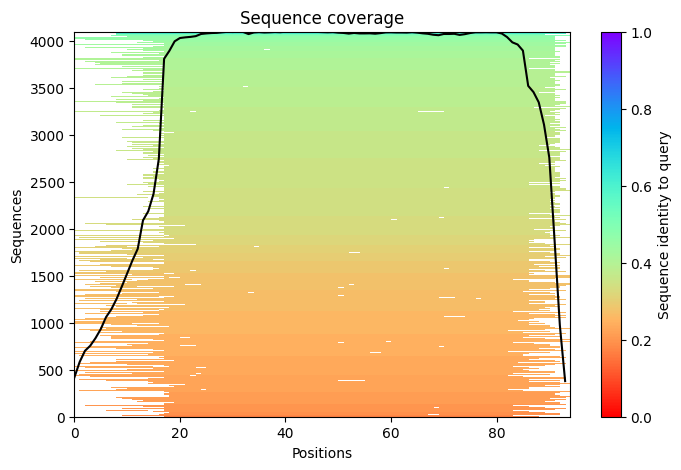

GC 14519
The following mutations will be performed: ['I89S']
Mutated residue I89S
The MSA will be masked in the mutated positions
Mutation before zero indexing: I89S
Mutation after zero indexing: I89S
Masked positions (mutation): 89
The deletion matrix will be masked in the mutated positions
Masked positions (deletion matrix): 89
loading alphafold params
running prediction
seed=000 model=model_1_ptm recycle=0
seed=000 model=model_1_ptm recycle=1
seed=000 model=model_1_ptm recycle=2
seed=000 model=model_1_ptm recycle=3
seed=000 model=model_1_ptm recycle=4
seed=000 model=model_2_ptm recycle=0
seed=000 model=model_2_ptm recycle=1
seed=000 model=model_2_ptm recycle=2
seed=000 model=model_2_ptm recycle=3
seed=000 model=model_2_ptm recycle=4
seed=000 model=model_3_ptm recycle=0
seed=000 model=model_3_ptm recycle=1
seed=000 model=model_3_ptm recycle=2
seed=000 model=model_3_ptm recycle=3
seed=000 model=model_3_ptm recycle=4
seed=000 model=model_4_ptm recycle=0
seed=000 model=model_4_ptm recyc

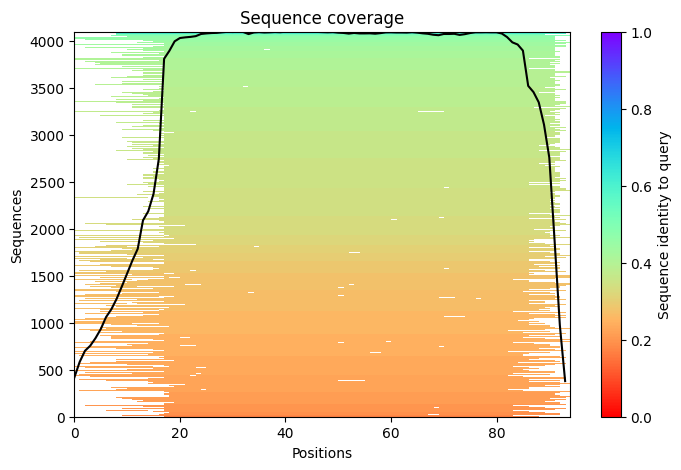

GC 10985
The following mutations will be performed: ['I89S', 'D72D']
Mutated residue I89S
Mutated residue D72D
The MSA will be masked in the mutated positions
Mutation before zero indexing: I89S
Mutation after zero indexing: I89S
Mutation before zero indexing: D72D
Mutation after zero indexing: D72D
Masked positions (mutation): 89, 72
The deletion matrix will be masked in the mutated positions
Masked positions (deletion matrix): 89, 72
loading alphafold params
running prediction
seed=000 model=model_1_ptm recycle=0
seed=000 model=model_1_ptm recycle=1
seed=000 model=model_1_ptm recycle=2
seed=000 model=model_1_ptm recycle=3
seed=000 model=model_1_ptm recycle=4
seed=000 model=model_2_ptm recycle=0
seed=000 model=model_2_ptm recycle=1
seed=000 model=model_2_ptm recycle=2
seed=000 model=model_2_ptm recycle=3
seed=000 model=model_2_ptm recycle=4
seed=000 model=model_3_ptm recycle=0
seed=000 model=model_3_ptm recycle=1
seed=000 model=model_3_ptm recycle=2
seed=000 model=model_3_ptm recycle=

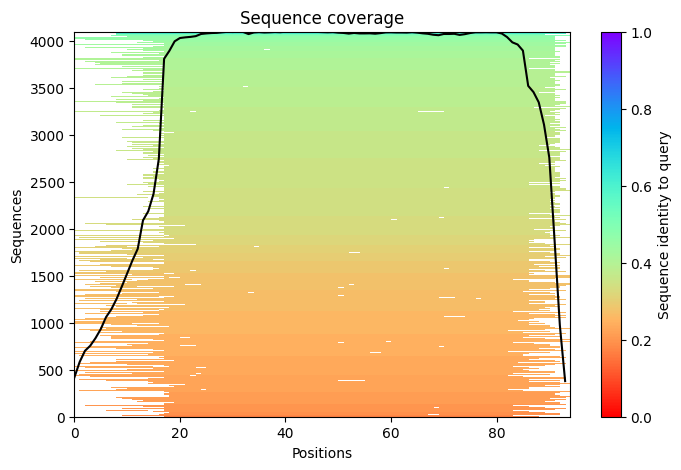

GC 10985
The following mutations will be performed: ['I89S', 'D72D', 'G73G']
Mutated residue I89S
Mutated residue D72D
Mutated residue G73G
The MSA will be masked in the mutated positions
Mutation before zero indexing: I89S
Mutation after zero indexing: I89S
Mutation before zero indexing: D72D
Mutation after zero indexing: D72D
Mutation before zero indexing: G73G
Mutation after zero indexing: G73G
Masked positions (mutation): 89, 72, 73
The deletion matrix will be masked in the mutated positions
Masked positions (deletion matrix): 89, 72, 73
loading alphafold params
running prediction
seed=000 model=model_1_ptm recycle=0
seed=000 model=model_1_ptm recycle=1
seed=000 model=model_1_ptm recycle=2
seed=000 model=model_1_ptm recycle=3
seed=000 model=model_1_ptm recycle=4
seed=000 model=model_2_ptm recycle=0
seed=000 model=model_2_ptm recycle=1
seed=000 model=model_2_ptm recycle=2
seed=000 model=model_2_ptm recycle=3
seed=000 model=model_2_ptm recycle=4
seed=000 model=model_3_ptm recycle=0
s

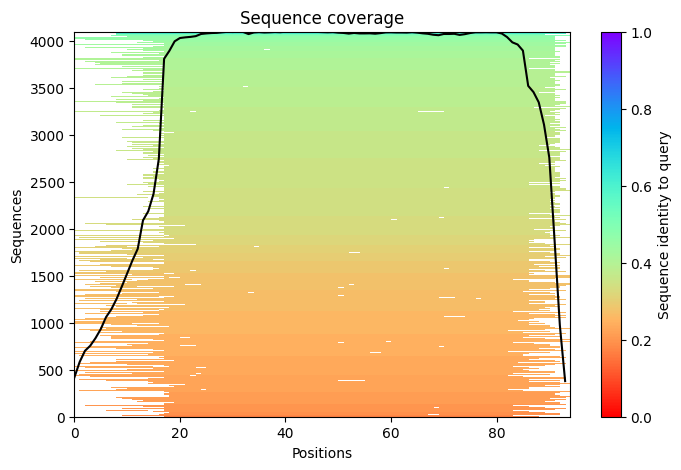

GC 10990
The following mutations will be performed: ['I89S', 'D72D', 'G73G', 'S74S']
Mutated residue I89S
Mutated residue D72D
Mutated residue G73G
Mutated residue S74S
The MSA will be masked in the mutated positions
Mutation before zero indexing: I89S
Mutation after zero indexing: I89S
Mutation before zero indexing: D72D
Mutation after zero indexing: D72D
Mutation before zero indexing: G73G
Mutation after zero indexing: G73G
Mutation before zero indexing: S74S
Mutation after zero indexing: S74S
Masked positions (mutation): 89, 72, 73, 74
The deletion matrix will be masked in the mutated positions
Masked positions (deletion matrix): 89, 72, 73, 74
loading alphafold params
running prediction
seed=000 model=model_1_ptm recycle=0
seed=000 model=model_1_ptm recycle=1
seed=000 model=model_1_ptm recycle=2
seed=000 model=model_1_ptm recycle=3
seed=000 model=model_1_ptm recycle=4
seed=000 model=model_2_ptm recycle=0
seed=000 model=model_2_ptm recycle=1
seed=000 model=model_2_ptm recycle=2
seed

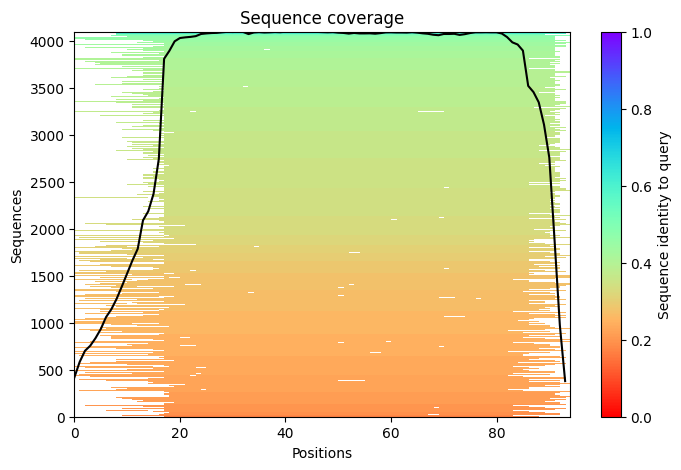

GC 10985
The following mutations will be performed: ['I89S', 'D72D', 'G73G', 'S74S', 'G75G']
Mutated residue I89S
Mutated residue D72D
Mutated residue G73G
Mutated residue S74S
Mutated residue G75G
The MSA will be masked in the mutated positions
Mutation before zero indexing: I89S
Mutation after zero indexing: I89S
Mutation before zero indexing: D72D
Mutation after zero indexing: D72D
Mutation before zero indexing: G73G
Mutation after zero indexing: G73G
Mutation before zero indexing: S74S
Mutation after zero indexing: S74S
Mutation before zero indexing: G75G
Mutation after zero indexing: G75G
Masked positions (mutation): 89, 72, 73, 74, 75
The deletion matrix will be masked in the mutated positions
Masked positions (deletion matrix): 89, 72, 73, 74, 75
loading alphafold params
running prediction
seed=000 model=model_1_ptm recycle=0
seed=000 model=model_1_ptm recycle=1
seed=000 model=model_1_ptm recycle=2
seed=000 model=model_1_ptm recycle=3
seed=000 model=model_1_ptm recycle=4
seed=00

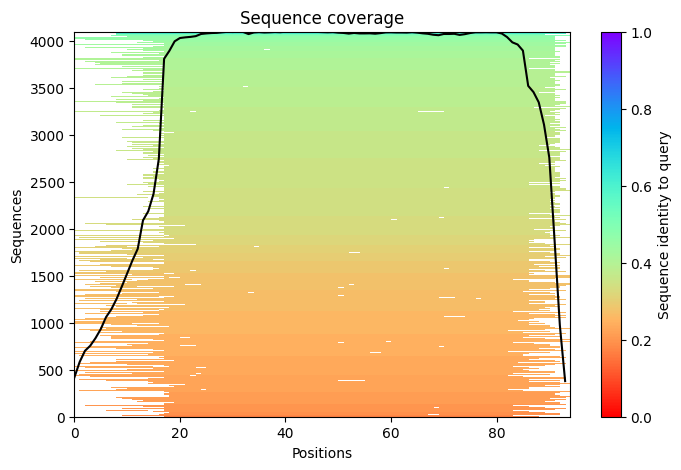

GC 10990
The following mutations will be performed: ['I89S', 'D72D', 'G73G', 'S74S', 'G75G', 'T76T']
Mutated residue I89S
Mutated residue D72D
Mutated residue G73G
Mutated residue S74S
Mutated residue G75G
Mutated residue T76T
The MSA will be masked in the mutated positions
Mutation before zero indexing: I89S
Mutation after zero indexing: I89S
Mutation before zero indexing: D72D
Mutation after zero indexing: D72D
Mutation before zero indexing: G73G
Mutation after zero indexing: G73G
Mutation before zero indexing: S74S
Mutation after zero indexing: S74S
Mutation before zero indexing: G75G
Mutation after zero indexing: G75G
Mutation before zero indexing: T76T
Mutation after zero indexing: T76T
Masked positions (mutation): 89, 72, 73, 74, 75, 76
The deletion matrix will be masked in the mutated positions
Masked positions (deletion matrix): 89, 72, 73, 74, 75, 76
loading alphafold params
running prediction
seed=000 model=model_1_ptm recycle=0
seed=000 model=model_1_ptm recycle=1
seed=000 m

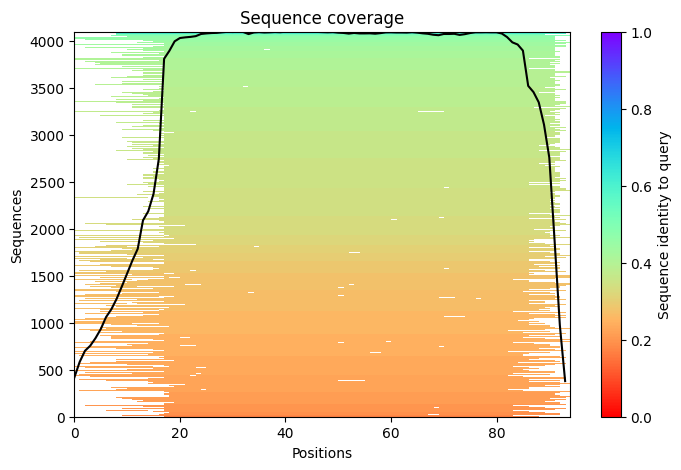

GC 11885
The following mutations will be performed: ['I89S', 'D72D', 'G73G', 'S74S', 'G75G', 'T76T', 'E81E']
Mutated residue I89S
Mutated residue D72D
Mutated residue G73G
Mutated residue S74S
Mutated residue G75G
Mutated residue T76T
Mutated residue E81E
The MSA will be masked in the mutated positions
Mutation before zero indexing: I89S
Mutation after zero indexing: I89S
Mutation before zero indexing: D72D
Mutation after zero indexing: D72D
Mutation before zero indexing: G73G
Mutation after zero indexing: G73G
Mutation before zero indexing: S74S
Mutation after zero indexing: S74S
Mutation before zero indexing: G75G
Mutation after zero indexing: G75G
Mutation before zero indexing: T76T
Mutation after zero indexing: T76T
Mutation before zero indexing: E81E
Mutation after zero indexing: E81E
Masked positions (mutation): 89, 72, 73, 74, 75, 76, 81
The deletion matrix will be masked in the mutated positions
Masked positions (deletion matrix): 89, 72, 73, 74, 75, 76, 81
loading alphafold pa

,Mutations,Status,Jobname,Duration,Error
0,I89S,completed,I89S_plus_I89S_897a1,0:02:25.404323,N/A
1,I89S_D72D,completed,I89S_plus_I89S_D72D_897a1,0:02:24.543446,N/A
2,I89S_D72D_G73G,completed,I89S_plus_I89S_D72D_G73G_897a1,0:02:25.248434,N/A
3,I89S_D72D_G73G_S74S,completed,I89S_plus_I89S_D72D_G73G_S74S_897a1,0:02:23.665472,N/A
4,I89S_D72D_G73G_S74S_G75G,completed,I89S_plus_I89S_D72D_G73G_S74S_G75G_897a1,0:02:23.816439,N/A
5,I89S_D72D_G73G_S74S_G75G_T76T,completed,I89S_plus_I89S_D72D_G73G_S74S_G75G_T76T_897a1,0:02:24.921809,N/A
6,I89S_D72D_G73G_S74S_G75G_T76T_E81E,completed,I89S_plus_I89S_D72D_G73G_S74S_G75G_T76T_E81E_8...,0:02:24.573336,N/A


{'I89S': {'status': 'completed',
  'jobname': 'I89S_plus_I89S_897a1',
  'duration': datetime.timedelta(seconds=145, microseconds=404323)},
 'I89S_D72D': {'status': 'completed',
  'jobname': 'I89S_plus_I89S_D72D_897a1',
  'duration': datetime.timedelta(seconds=144, microseconds=543446)},
 'I89S_D72D_G73G': {'status': 'completed',
  'jobname': 'I89S_plus_I89S_D72D_G73G_897a1',
  'duration': datetime.timedelta(seconds=145, microseconds=248434)},
 'I89S_D72D_G73G_S74S': {'status': 'completed',
  'jobname': 'I89S_plus_I89S_D72D_G73G_S74S_897a1',
  'duration': datetime.timedelta(seconds=143, microseconds=665472)},
 'I89S_D72D_G73G_S74S_G75G': {'status': 'completed',
  'jobname': 'I89S_plus_I89S_D72D_G73G_S74S_G75G_897a1',
  'duration': datetime.timedelta(seconds=143, microseconds=816439)},
 'I89S_D72D_G73G_S74S_G75G_T76T': {'status': 'completed',
  'jobname': 'I89S_plus_I89S_D72D_G73G_S74S_G75G_T76T_897a1',
  'duration': datetime.timedelta(seconds=144, microseconds=921809)},
 'I89S_D72D_G73G

In [3]:
%load_ext autoreload
%autoreload 2

from IPython.display import clear_output, display
import os
import gc
import jax
import pandas as pd
import numpy as np
from datetime import datetime
from alphamask.core import MutateAndMaskingPipeline

# Basic parameters
jobname_prefix = "I89S_plus"  # @param {type:"string"}
parent_path = "/content"  # @param {type:"string"}

# @markdown ### AlphaFold2 Configuration
num_recycles = 4  # @param {type:"slider", min:1, max:20, step:1}
num_seeds = 4  # @param {type:"slider", min:1, max:20, step:1}

# @markdown ### MSA Options
msa_method = "custom_a3m"  # @param ["mmseqs2", "single_sequence", "custom_fas", "custom_a3m", "custom_sto"] {type:"string"}
custom_a3m_path = "/content/I89S_plus_vanilla_897a1/in/msa.a3m"  # @param {type:"string"}

# @markdown ### Visualization Options
show_msa_plots = False  # @param {type:"boolean"}
show_coevolution = False  # @param {type:"boolean"}
plot_window = 10  # @param {type:"slider", min:1, max:20, step:1}
        
# Create visualizer instance
visualizer = MSAVisualizer(
    show_msa_plots=show_msa_plots,
    show_coevolution=show_coevolution,
    plot_window=plot_window
)

# Clear previous output
clear_output(wait=True)

# Define mutations to run
mutations_to_run = [
    ["I89S"],  # Single mutant
    ["I89S", "D72D"],  # Double mutant
    ["I89S", "D72D", "G73G"],  # Triple mutant
    ["I89S", "D72D", "G73G", "S74S"],  # Quadruple mutant
    ["I89S", "D72D", "G73G", "S74S", "G75G"],  # Quintuple mutant
    ["I89S", "D72D", "G73G", "S74S", "G75G", "T76T"],  # Sextuple mutant 
    ["I89S", "D72D", "G73G", "S74S", "G75G", "T76T", "E81E"],  # Septuple mutant
]

# Create pipeline instances for each mutation combination
pipelines = []
for mutation_set in mutations_to_run:
    mutation_str = "_".join(mutation_set)
    
    # Create pipeline parameters
    params = {
        "sequence": sequence,
        "jobname": f"{jobname_prefix}_{mutation_str}",
        "parentPath": parent_path,
        "setupPath": "/content/setup",
        "masking_mode": "list",
        "mask_msa": True,
        "mask_deletion_matrix": True,
        "cols": [int(mut[1:-1]) for mut in mutation_set],  # Extract position numbers
        "mask_identity": "X",
        "mutations": mutation_set,
        "num_recycles": num_recycles,
        "num_seeds": num_seeds,
        "msa_method": msa_method,
        "custom_a3m_path": custom_a3m_path,
        "run_control": False,
        "run_only_control": False,
        # Add other required parameters with default values
        "copies": 1,
        "pair_mode": "unpaired_paired",
        "cov": 75,
        "id": 90,
        "qid": 0,
        "do_not_filter": False,
        "template_mode": "none",
        "pdb": "",
        "chain": "A",
        "rm_template_seq": False,
        "propagate_to_copies": True,
        "do_not_align": False,
        "model_type": "monomer (ptm)",
        "rank_by": "plddt",
        "debug": False,
        "use_initial_guess": False,
        "num_msa": 512,
        "num_extra_msa": 1024,
        "use_cluster_profile": True,
        "model": "all",
        "recycle_early_stop_tolerance": 0.0,
        "select_best_across_recycles": False,
        "use_mlm": False,
        "use_dropout": False,
        "seed": 0,
        "show_images": True,
        "unified_memory": False,
        "cols_range": [],
        "overwrite": False,
        "show_figures": True
    }
    
    pipeline = MutateAndMaskingPipeline(params=params)
    pipelines.append((mutation_str, pipeline))

print(f"\n🚀 Preparing to run {len(pipelines)} AlphaMask experiments:")
for mutation_str, _ in pipelines:
    print(f"  • {mutation_str}")
print(f"\n📁 Results will be saved in: {parent_path}")
print(f"⚙️ Using {num_recycles} recycles and {num_seeds} seeds per prediction")
print(f"🧬 MSA method: {msa_method}")
if custom_a3m_path:
    print(f"📄 Using custom MSA from: {custom_a3m_path}")

proceed = "y" #input("\n⚠️ Ready to start processing mutations? (y/n): ")
if proceed.lower() != 'y':
    print("❌ Operation cancelled")
    raise SystemExit

# Run pipelines
results = {}
for mutation_str, pipeline in pipelines:
    print(f"\n🔄 Processing mutation combination: {mutation_str}")
    print("-" * 50)

    try:
        start_time = datetime.now()
        jobname = pipeline.run()
        
        # Visualize results using the new visualizer
        visualizer.visualize_pipeline_results(
            pipeline=pipeline,
            parent_path=parent_path,
            mutation_str=mutation_str
        )
        
        duration = datetime.now() - start_time

        results[mutation_str] = {
            'status': 'completed',
            'jobname': jobname,
            'duration': duration
        }
        print(f"✅ Successfully completed {mutation_str} in {duration}")

    except Exception as e:
        print(f"❌ Error processing {mutation_str}: {str(e)}")
        results[mutation_str] = {
            'status': 'failed',
            'error': str(e)
        }

    # Clear memory between runs
    backend = jax.lib.xla_bridge.get_backend()
    for buf in backend.live_buffers():
        buf.delete()
    gc.collect()

# Print summary and create results table
print("\n📊 Experiment Summary:")
print("-" * 50)
successful = sum(1 for r in results.values() if r['status'] == 'completed')
failed = len(results) - successful

print(f"\n📈 Final Statistics:")
print(f"Total mutation combinations processed: {len(results)}")
print(f"Successful: {successful}")
print(f"Failed: {failed}")

# Create results dataframe
results_df = pd.DataFrame([
    {
        'Mutations': mutation_str,
        'Status': result['status'],
        'Jobname': result.get('jobname', 'N/A'),
        'Duration': str(result.get('duration', 'N/A')),
        'Error': result.get('error', 'N/A')
    }
    for mutation_str, result in results.items()
])

# Display results
display(results_df)

# Return results dictionary
results

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


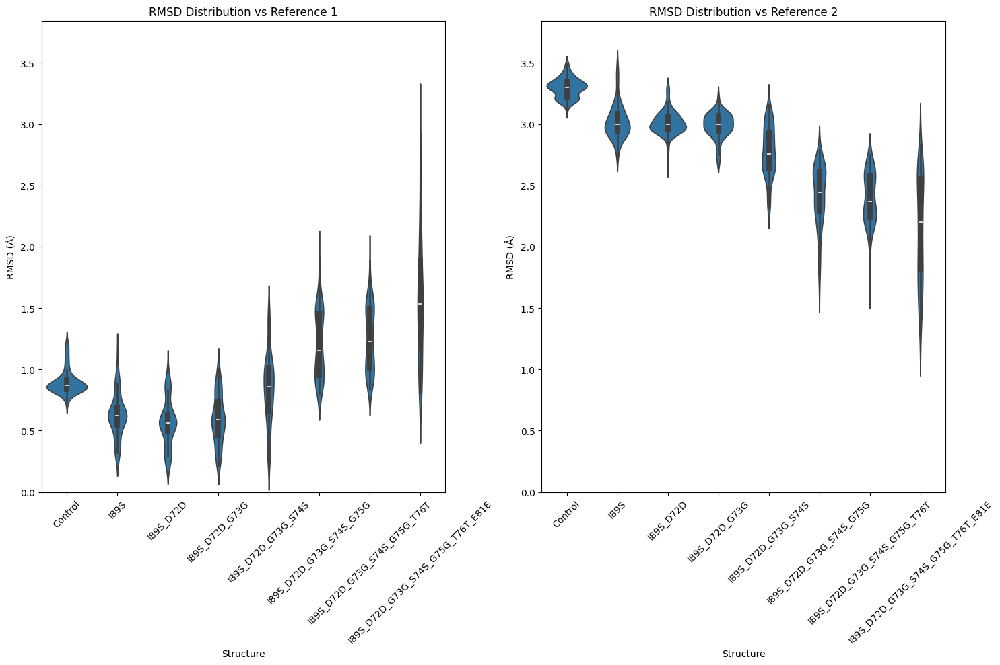

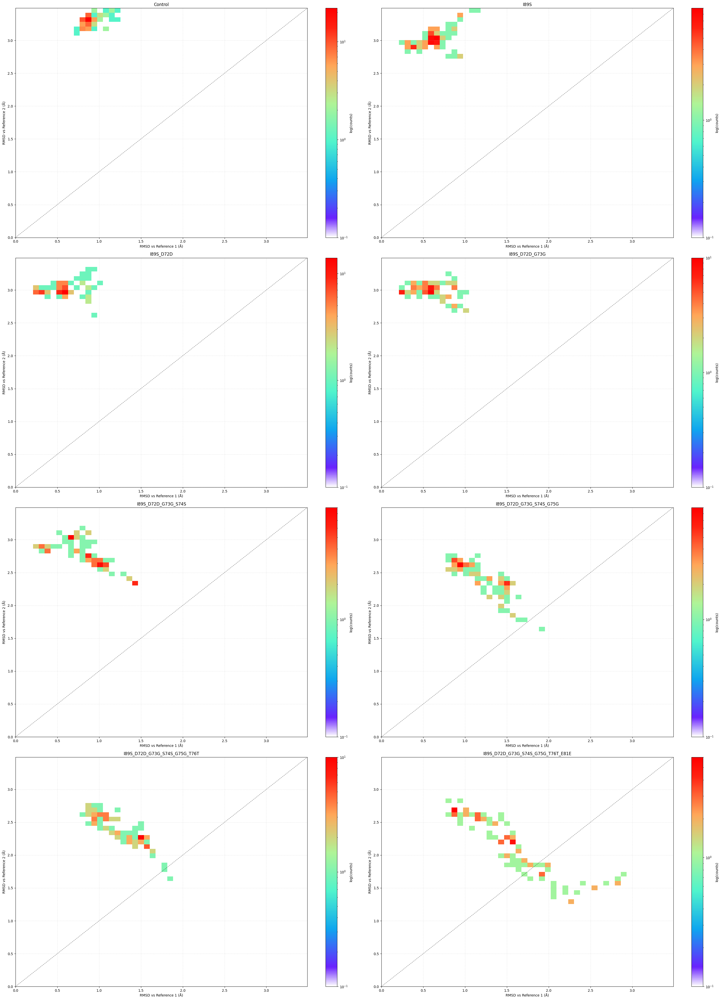


📋 RMSD Analysis Summary:

📋 Detailed RMSD Data Preview:

✅ Analysis complete!


In [6]:
# @title RMSD Analysis and Visualization Tool 📊 {"run": "auto", "display-mode":"form"}
# @markdown ## Comprehensive RMSD Analysis
# @markdown Analyze and visualize RMSD distributions and landscapes for mutant structures
%load_ext autoreload
%autoreload 2
from IPython.display import clear_output, display, HTML
from pathlib import Path
from google.colab import data_table
import logging
from alphamask.analysis import (
    RMSDConfig,
    PlotConfig,
    AnalysisConfig,
    RMSDAnalysis
)
%autoreload 2
# Configure logging
logging.basicConfig(level=logging.INFO)
import plotly.io as pio
pio.renderers.default = "vscode"
# Analysis Parameters
# @markdown ### Reference Structures
reference_pdb1 = "/content/state1.pdb"  # @param {type:"string"}
reference_pdb2 = "/content/state2.pdb"  # @param {type:"string"}
control_path = "/content/I89S_plus_vanilla_897a1_1/out/pdbs"  # @param {type:"string"}
parent_path = "/content"  # @param {type:"string"}

# @markdown ### Region Selection
start_residue = 1  # @param {type:"number"}
end_residue = 94  # @param {type:"number"}
use_region = True  # @param {type:"boolean"}

# @markdown ### Atom Selection
atom_selection = "CA"  # @param ["CA", "backbone", "all"] {type:"string"}

# @markdown ### Visualization Options
show_violin = True  # @param {type:"boolean"}
show_landscapes = False  # @param {type:"boolean"}
show_scatterplot = True  # @param {type:"boolean"}
include_control = True  # @param {type:"boolean"}
plot_width = 15  # @param {type:"slider", min:8, max:20, step:1}
plot_height = 10  # @param {type:"slider", min:4, max:15, step:1}

# Create configuration objects
rmsd_config = RMSDConfig(
    atom_selection=atom_selection,
    start_residue=start_residue if use_region else None,
    end_residue=end_residue if use_region else None,
    use_region=use_region
)

plot_config = PlotConfig(
    plot_width=plot_width,
    plot_height=plot_height
)

analysis_config = AnalysisConfig(
    rmsd_config=rmsd_config,
    plot_config=plot_config,
    output_dir="rmsd_analysis",
    save_plots=True,
    show_plots=True,
    include_control=include_control
)

# Initialize analysis pipeline
analyzer = RMSDAnalysis(analysis_config)

# Prepare model directories
model_dirs = {}
for mutation, data in results.items():
    if data['status'] == 'completed':
        model_dirs[mutation] = str(Path(parent_path) / data['jobname'] / "out" / "pdbs")

# Run analysis
try:
    analysis_results = analyzer.run_analysis(
        ref_pdb1=reference_pdb1,
        ref_pdb2=reference_pdb2 if reference_pdb2 else None,
        model_dirs=model_dirs,
        control_dir=control_path if include_control else None
    )
    
    # Display summary statistics
    print("\n📋 RMSD Analysis Summary:")
    data_table.DataTable(
        analysis_results['statistics']['summary'],
        include_index=False,
        num_rows_per_page=20
    )
    
    # Display detailed data preview
    print("\n📋 Detailed RMSD Data Preview:")
    data_table.DataTable(
        analysis_results['statistics']['detailed'].head(20),
        include_index=False
    )
    
    print("\n✅ Analysis complete!")
    
except Exception as e:
    print(f"\n❌ Error during analysis: {str(e)}")
    print("\nDebug information:")
    print(f"Reference PDB 1: {reference_pdb1}")
    print(f"Reference PDB 2: {reference_pdb2}")
    print(f"Parent path: {parent_path}")
    print(f"Atom selection: {atom_selection}")
    print(f"Region: {start_residue}-{end_residue}" if use_region else "entire structure")
    raise

# FAQ and Usage Guide

In [29]:
# @markdown ## What's New in This Version
# @markdown - Added mutation capability with `iterative_single_mask_mutate` strategy
# @markdown - Improved MSA handling with multiple methods
# @markdown - Automatic results compression and download
# @markdown - Enhanced memory management
# @markdown - More flexible position selection

# @markdown ## Masking Strategies Explained

# @markdown ### 1. Iterative Single Position (iterative_single)
# @markdown - **What it does**: Masks one position at a time, runs AF2 for each position
# @markdown - **Usage options**:
# @markdown   - Leave "Positions to Process" empty → analyze entire sequence
# @markdown   - Enter specific positions (e.g., "1,5,10") → analyze only those positions
# @markdown - **Example**: With "1,5,10" → three predictions, each masking one position
# @markdown - **Use case**: Understanding individual residue contributions

# @markdown ### 2. Iterative Single Position with Mutation (iterative_single_mask_mutate)
# @markdown - **What it does**: Combines masking and mutation at each position
# @markdown - **Usage**:
# @markdown   - Enter positions to analyze
# @markdown   - Specify mutation (e.g., "S89R")
# @markdown - **Example**: Position "89", mutation "S89R" → predicts structure with position 89 masked and mutated
# @markdown - **Use case**: Studying mutation effects in masked contexts

# @markdown ### 3. Mask Positions (mask_positions)
# @markdown - **What it does**: Masks all specified positions simultaneously
# @markdown - **Usage**: Enter all positions to mask (e.g., "1,5,10")
# @markdown - **Example**: "1,5,10" → one prediction with all three positions masked
# @markdown - **Use case**: Analyzing combined effects of multiple positions

# @markdown ### 4. Unmask Positions (unmask_positions)
# @markdown - **What it does**: Masks everything EXCEPT specified positions
# @markdown - **Usage**: Enter positions to keep unmasked
# @markdown - **Example**: "1,5,10" in 100-residue protein → masks positions 2-4,6-9,11-100
# @markdown - **Use case**: Focusing on specific structural regions

# @markdown ## Configuration Guide

# @markdown ### Basic Parameters
# @markdown ```python
# @markdown sequence = "YOUR_SEQUENCE"  # Input protein sequence
# @markdown jobname_prefix = "experiment1"  # Prefix for output files
# @markdown masking_strategy = "iterative_single"  # Choose strategy
# @markdown positions_str = "1,5,10"  # Positions to process (optional)
# @markdown ```

# @markdown ### Advanced Parameters
# @markdown ```python
# @markdown num_recycles = 6  # Number of recycles (3-20)
# @markdown num_seeds = 6  # Number of seeds (3-20)
# @markdown msa_method = "mmseqs2"  # MSA generation method
# @markdown run_control = True  # Run unmasked prediction
# @markdown ```

# @markdown ## Common Questions

# @markdown ### Q: How do I set up my first experiment?
# @markdown A: Basic setup steps:
# @markdown 1. Paste your sequence
# @markdown 2. Choose masking strategy
# @markdown 3. Set positions (if needed)
# @markdown 4. Run the cell
# @markdown Default parameters work well for most cases

# @markdown ### Q: Which MSA method should I use?
# @markdown A: Available options:
# @markdown - `mmseqs2`: Best for most cases
# @markdown - `single_sequence`: Quick testing
# @markdown - `custom_a3m`: Use existing alignment
# @markdown - `custom_fas`: Use FASTA file
# @markdown - `custom_sto`: Use Stockholm file

# @markdown ### Q: How long will it take?
# @markdown A: Approximate times per prediction:
# @markdown - Basic run (3 recycles): ~15-20 minutes
# @markdown - Standard run (6 recycles): ~25-30 minutes
# @markdown - High-accuracy (12 recycles): ~45-60 minutes
# @markdown - Total time = (predictions × time per prediction)

# @markdown ### Q: Memory issues?
# @markdown A: Try these solutions:
# @markdown ```python
# @markdown num_recycles = 3  # Reduce recycles
# @markdown num_seeds = 3  # Reduce seeds
# @markdown msa_method = "single_sequence"  # Simpler MSA
# @markdown ```

# @markdown ### Q: Recommended settings for different scenarios?
# @markdown A: Common configurations:
# @markdown ```python
# @markdown # Quick test
# @markdown num_recycles = 3
# @markdown num_seeds = 3
# @markdown msa_method = "single_sequence"
# @markdown
# @markdown # Standard run
# @markdown num_recycles = 6
# @markdown num_seeds = 6
# @markdown msa_method = "mmseqs2"
# @markdown
# @markdown # High accuracy
# @markdown num_recycles = 12
# @markdown num_seeds = 12
# @markdown msa_method = "mmseqs2"
# @markdown ```

# @markdown ### Q: Where are my results?
# @markdown A: Results are:
# @markdown 1. Saved in your specified parent_path
# @markdown 2. Automatically zipped
# @markdown 3. Downloaded to your computer
# @markdown 4. Named: [jobname_prefix]_[strategy]_[positions].zip

# @markdown ### Q: Should I run control predictions?
# @markdown A: Recommended when:
# @markdown - First time running sequence
# @markdown - Comparing masked vs unmasked
# @markdown - Validating mutations
# @markdown Skip if you already have unmasked prediction

# @markdown ## Mutation Analysis Guide

# @markdown ### Example mutation workflow:
# @markdown ```python
# @markdown # Single mutation
# @markdown masking_strategy = "iterative_single_mask_mutate"
# @markdown positions_str = "89"
# @markdown mutations = "S89R"
# @markdown
# @markdown # Run with validation
# @markdown run_control = True  # Compare with wild-type
# @markdown ```

# @markdown ### Tips for mutation analysis:
# @markdown - Always run control for comparison
# @markdown - Use consistent parameters between runs
# @markdown - Consider running multiple seeds
# @markdown - Check surrounding residues

# @markdown ## Advanced Usage

# @markdown ### Example: Regional analysis
# @markdown ```python
# @markdown # Analyze binding site (positions 10-20)
# @markdown masking_strategy = "unmask_positions"
# @markdown positions_str = "10,11,12,13,14,15,16,17,18,19,20"
# @markdown ```

# @markdown ### Example: Multiple positions
# @markdown ```python
# @markdown # Mask multiple specific positions
# @markdown masking_strategy = "mask_positions"
# @markdown positions_str = "1,5,10,15,20"
# @markdown ```

# @markdown ### Example: High-throughput scanning
# @markdown ```python
# @markdown # Scan entire sequence
# @markdown masking_strategy = "iterative_single"
# @markdown positions_str = ""  # Empty for full sequence
# @markdown ```